# Practica Machine Learning con Python
#### Autor: Miguel Moreno Mardones
#### Fecha: 5/05/2022
#### Master Big Data: Data Science - UCM

In [1]:
#Importamos las librerias y datos necesarios
import pandas as pd
import numpy as np
import seaborn as sns
from datetime import date 
import pandas_profiling
from pandas_profiling import ProfileReport
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib.ticker as ticker
import seaborn as sns

In [2]:
#Datos de diciembre
diciembre_clientes = pd.read_csv("clientes_diciembre.csv", sep = '|')
diciembre_consumos = pd.read_csv("consumos_diciembre.csv", sep = '|')
diciembre_financiacion = pd.read_csv("financiacion_diciembre.csv", sep = '|')
diciembre_productos = pd.read_csv("productos_diciembre.csv", sep = '|')

#Datos de enero
enero_clientes = pd.read_csv("clientes_enero.csv", sep = '|')
enero_consumos = pd.read_csv("consumos_enero.csv", sep = '|')
enero_financiacion = pd.read_csv("financiacion_enero.csv", sep = '|')
enero_productos = pd.read_csv("productos_enero.csv", sep = '|')

## Fase 1: Construccion del dataset para el tablon analitico

In [3]:
#Mes de diciembre = dfTablon
dfTablon = pd.merge(diciembre_clientes, diciembre_consumos, on = 'id')
dfTablon = pd.merge(dfTablon, diciembre_productos, on = 'id')
dfTablon = pd.merge(dfTablon, diciembre_financiacion, on = 'id', how = 'outer')
#Mes de enero = dfTablon2
dfTablon2 = pd.merge(enero_clientes, enero_consumos, on = 'id')
dfTablon2 = pd.merge(dfTablon2, enero_productos, on = 'id')
dfTablon2 = pd.merge(dfTablon2, enero_financiacion, on = 'id', how = 'outer')

In [4]:
#En una primera istancia modificamos valores NA
dfTablon['num_dt'] = dfTablon['num_dt'].fillna(0)
dfTablon['incidencia'] = dfTablon['incidencia'].fillna('NO')
dfTablon['financiacion'] = dfTablon['financiacion'].fillna('NO')
dfTablon['imp_financ'] = dfTablon['imp_financ'].fillna(0)
dfTablon['descuentos'] = dfTablon['descuentos'].fillna('NO')

dfTablon2['num_dt'] = dfTablon2['num_dt'].fillna(0)
dfTablon2['incidencia'] = dfTablon2['incidencia'].fillna('NO')
dfTablon2['financiacion'] = dfTablon2['financiacion'].fillna('NO')
dfTablon2['imp_financ'] = dfTablon2['imp_financ'].fillna(0)
dfTablon2['descuentos'] = dfTablon2['descuentos'].fillna('NO')

In [5]:
#Cambiamos nombres de las columnas
dfTablon.rename(columns = {'num_dt':'num_lineas_impago'}, inplace = True)
dfTablon2.rename(columns = {'num_dt':'num_lineas_impago'}, inplace = True)

In [6]:
#Generamos los dashboard con las columnas que consideramos necesarias
df = pd.DataFrame(data = dfTablon.drop(['id'], axis = 1))
profile = ProfileReport(df, config_file="your_config.yml")
profile.to_file('dashboard_dic.html')

df2 = pd.DataFrame(data = dfTablon2.drop(['id'], axis = 1))
profile2 = ProfileReport(df2, config_file="your_config2.yml")
profile2.to_file('dashboard_ener.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

C:\Users\Miguel\anaconda3\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

C:\Users\Miguel\anaconda3\lib\site-packages\scipy\stats\stats.py:4812: RuntimeWarning: overflow encountered in longlong_scalars
  (2 * xtie * ytie) / m + x0 * y0 / (9 * m * (size - 2)))


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]


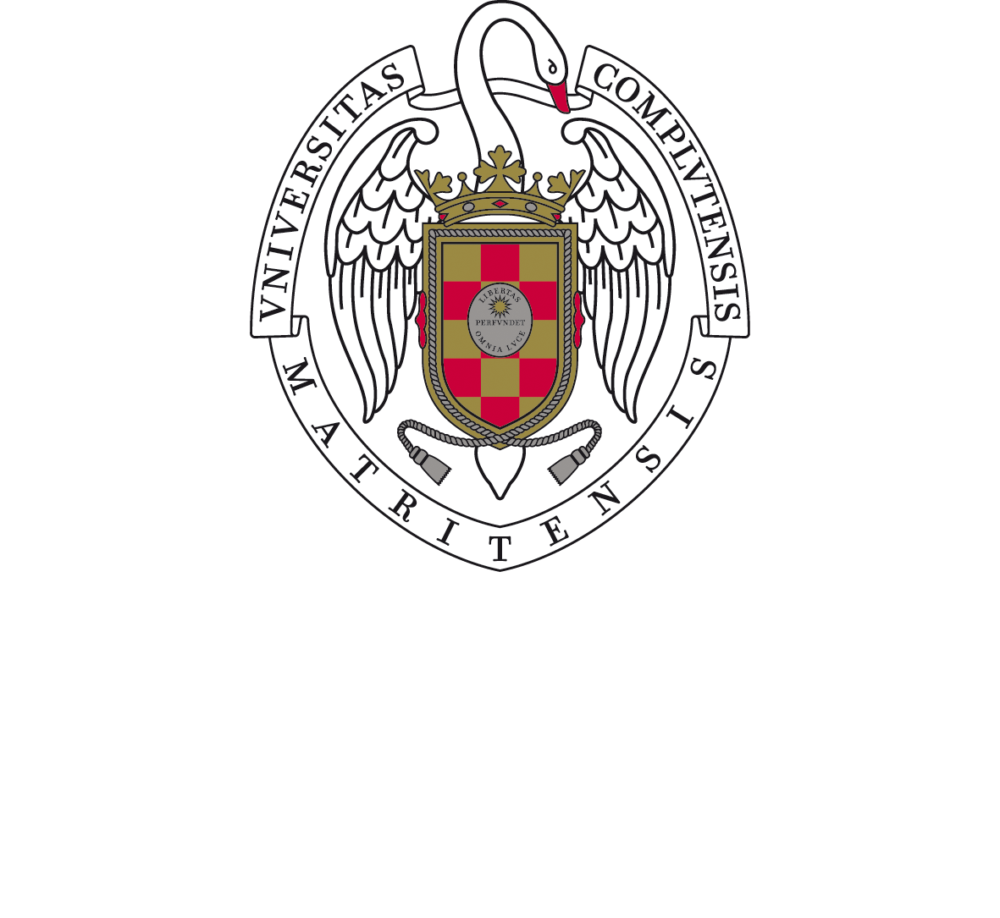

In [7]:
#Para mejor visualizacion = archivo html
profile


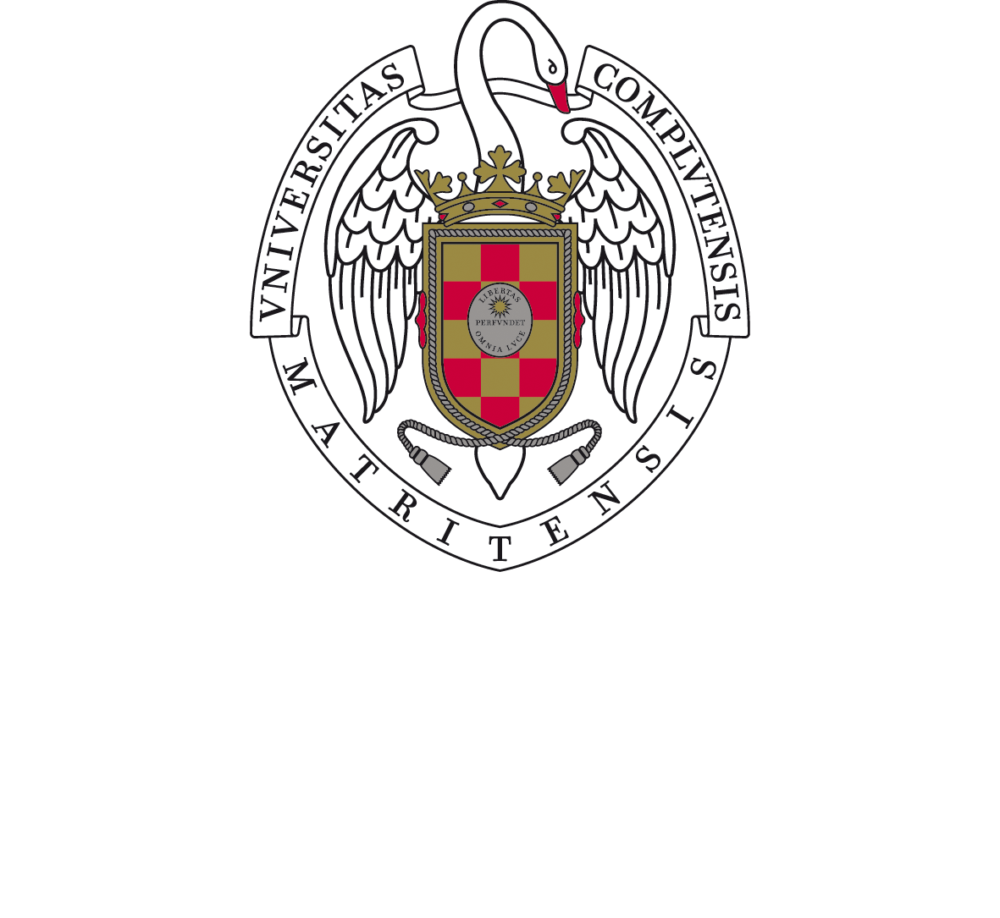

In [8]:
#Mejor visualizacion en archivo html
profile2

## Fase 2: Limpieza y preprocesado

### NA's restantes

In [9]:
#Asociamos el valor NA de vel_conexion a la moda al ser factor
dfTablon['vel_conexion'] = dfTablon['vel_conexion'].fillna('50MB')
dfTablon2['vel_conexion'] = dfTablon2['vel_conexion'].fillna('50MB')
dfTablon2['conexion'] = dfTablon2['conexion'].fillna('ADSL')

In [10]:
#Ya no hay valores NA
print(dfTablon.isna().sum().unique())
print(dfTablon2.isna().sum().unique())

[0]
[0]


### Valores categoricos

### Numero de lineas en impago

In [11]:
#Cambiamos el tipo de numero lineas impago float a entero
dfTablon = dfTablon.astype({"num_lineas_impago": int})
dfTablon2 = dfTablon2.astype({"num_lineas_impago": int})

### Antiguedad del contrato

In [12]:
#De antiguedad quitamos la hora y lo convertimos a tipo date
dfTablon["antiguedad"] = dfTablon["antiguedad"].str.slice_replace(10, repl='')
dfTablon2["antiguedad"] = dfTablon2["antiguedad"].str.slice_replace(10, repl='')

In [13]:
#Unificamos formato de fechas
dfTablon['antiguedad'] = pd.to_datetime(dfTablon.antiguedad)
dfTablon2['antiguedad'] = pd.to_datetime(dfTablon2.antiguedad)
dfTablon['antiguedad'] = dfTablon['antiguedad'].dt.strftime('%d/%m/%Y')
dfTablon2['antiguedad'] = dfTablon2['antiguedad'].dt.strftime('%d/%m/%Y')
dfTablon['antiguedad'] = pd.to_datetime(dfTablon['antiguedad'])
dfTablon2['antiguedad'] = pd.to_datetime(dfTablon2['antiguedad'])

### Creacion de nueva variable: dias con contrato vigente

In [14]:
#Creamos variable today con la fecha actual que se actualiza cada vez que generamos dicho objeto
today = date.today()

#Formato similar al de antiguedad
todayUpdated = pd.to_datetime(today.strftime("%d/%m/%Y"))

In [15]:
#Nueva variable
difDates = todayUpdated - dfTablon['antiguedad'] 
difDates1 = todayUpdated - dfTablon2['antiguedad']
dfTablon['dias_contrato'] = difDates // np.timedelta64(1,'D') 
dfTablon2['dias_contrato'] = difDates1 // np.timedelta64(1,'D') 

### Cambio de resto de variables

In [16]:
#Eliminamos la variable antiguedad
del dfTablon['antiguedad']
del dfTablon2['antiguedad']

In [17]:
#Guardamos la velocidad de conexion como int
dfTablon["vel_conexion"] = dfTablon["vel_conexion"].str.replace('MB','')
dfTablon2["vel_conexion"] = dfTablon2["vel_conexion"].str.replace('MB','')

my_list = np.array(dfTablon["vel_conexion"])
my_list = np.where(my_list == '16598', '200', my_list)
my_list = np.where(my_list == '?', '200', my_list)
my_list = np.where(my_list == '1', '200', my_list)

dfTablon["vel_conexion"] = my_list

In [18]:
#Cambiamos el tipo
dfTablon = dfTablon.astype({"vel_conexion": int})
dfTablon2 = dfTablon2.astype({"vel_conexion": int})

In [19]:
#Guardamos csv de Enero
dfTablon2.to_csv('dfFinalEnero.csv')

In [20]:
#Funcion que cambia el tipo object a int (factorizandolos)
def factorizeObjects(dataset):
    for i in list(dataset.select_dtypes(include=['object']).columns):
        dataset[i] = list(LabelEncoder().fit_transform(dataset[i]))   

In [21]:
#Llamamos a la funcion
dfDiciembre = dfTablon; dfEnero = dfTablon2
factorizeObjects(dfDiciembre); factorizeObjects(dfEnero)

La factorizacion de algunas variables implica el cambio de tipo String (Object) a tipo Int categórico. Estas columnas modificadas son:

Provincia: Cada provincia es representada por un numero
Incidencia: NO/0; SI/1
Conexion: ADSL/0; FIBRA/1
TV: FUTBOL/1; FAMILIAR/0; 2/TOTAL
Financiacion: NO/0; SI/1
Descuentos: NO/0; SI/1

## Fase 2.5: Creacion de la variable respuesta

In [22]:
#Obtenemos los id de los que PERMANECEN
id_Permanencia = pd.merge(dfDiciembre, dfEnero, on = "id")
id_Permanencia = list(id_Permanencia['id'])

In [23]:
#Creamos una lista booleana que indica que id's de dfTablon se encuentran en id_Permanencia
fuga_cliente = list(dfDiciembre['id'].isin(id_Permanencia))

In [24]:
#Cambiamos los valores de la lista fuga_cliente
for i in range(len(fuga_cliente)):
    if fuga_cliente[i] == True:
        fuga_cliente[i] = 0
    elif fuga_cliente[i] == False:
        fuga_cliente[i] = 1

## Fase 3: Construccion de Train y Test

In [25]:
#Importamos librerias para crear los datos de train y test
from sklearn.model_selection import train_test_split
from scipy import stats
import csv

In [26]:
#Creamos una lista que guarde los id's de los clientes de diciembre
lst = list(dfDiciembre['id'])
 
#Creamos el Dataset Respuesta de los datos de diciembre
dfRespuesta = pd.DataFrame(list(zip(lst, fuga_cliente)), columns = ['id', 'fuga'])

In [27]:
#Tipos de datos en los datos de diciembre y enero
print(dfDiciembre.dtypes)
print('\n')
print(dfEnero.dtypes)
print('\n')

id                     int64
edad                   int64
facturacion          float64
provincia              int32
num_lineas             int64
num_lineas_impago      int32
incidencia             int32
num_llamad_ent         int64
num_llamad_sal         int64
mb_datos               int64
seg_llamad_ent         int64
seg_llamad_sal         int64
conexion               int32
vel_conexion           int32
TV                     int32
financiacion           int32
imp_financ           float64
descuentos             int32
dias_contrato          int64
dtype: object


id                     int64
edad                   int64
facturacion          float64
provincia              int32
num_lineas             int64
num_lineas_impago      int32
incidencia             int32
num_llamad_ent         int64
num_llamad_sal         int64
mb_datos               int64
seg_llamad_ent         int64
seg_llamad_sal         int64
conexion               int32
vel_conexion           int32
TV                     int3

In [28]:
#Asociamos el id como index en los datasets creados
dfDiciembre.set_index('id', inplace=True)
dfEnero.set_index('id', inplace = True)
dfRespuesta.set_index('id', inplace=True)

In [29]:
#Generamos train y test
dfDiciembre_train, dfDiciembre_test, dfRespuesta_train, dfRespuesta_test = train_test_split(dfDiciembre, dfRespuesta, test_size = 0.2, 
                                                    random_state = 800, stratify = dfRespuesta)

In [30]:
#dfDiciembre_train = Datos de Train para entrenar el modelo
#dfRespuesta_train = Respuesta para entrenar el modelo
#dfDiciembre_test = Datos sobre los que validar el modelo
#dfRespuesta_test = Respuesta sobre la que comparar las predicciones

En este punto, nos disponemos a construir modelos de ML sobre el conjunto de datos: dfDiciembre_train en base a la respuesta: dfRespuesta_train. Podemos aplicar cualquiera de las técnicas vistas en clase tales como: Regresión logística (al ser una variable binaria), Modelos de clasificiación... En una primera instancia, realizamos estos modelos sobre el conjunto de variables entero, será en los siguientes pasos donde modificaremos tanto el número de variables utilizadas como su tipo o características.

## Fase 4: Aplicacion del modelo

In [31]:
#Librerias para aplicar el modelo
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn import naive_bayes
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, auc, confusion_matrix, f1_score, precision_score, recall_score, roc_curve
import matplotlib.pyplot as plt
from sklearn import preprocessing
import random

### Regresion logistica

In [32]:
#Modelo de regresion logistica
random.seed(30)
regLogistica = LogisticRegression(solver = 'liblinear', max_iter = 1000, random_state = 100).fit(dfDiciembre_train, dfRespuesta_train['fuga'])

In [33]:
#Realizamos las predicciones
regLogisticaPred = regLogistica.predict(dfDiciembre_test)
precisionLogisPred = accuracy_score(dfRespuesta_test, regLogisticaPred)
print("El modelo posee una precision del: %.2f%%" % (precisionLogisPred * 100.0))

El modelo posee una precision del: 93.60%


In [34]:
#Report de la clasificacion detallada
print(classification_report(dfRespuesta_test, regLogisticaPred))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97     17677
           1       0.78      0.19      0.31      1417

    accuracy                           0.94     19094
   macro avg       0.86      0.59      0.64     19094
weighted avg       0.93      0.94      0.92     19094



In [35]:
#Matriz de confusion obtenida
print('Matriz de confusión de xGBoost:')
print(confusion_matrix(dfRespuesta_test, regLogisticaPred))

Matriz de confusión de xGBoost:
[[17603    74]
 [ 1148   269]]


In [36]:
#Resumen de la clasificacion obtenida
a = (confusion_matrix(dfRespuesta_test, regLogisticaPred))
print('De un total de', len(dfRespuesta_test), 'clientes:')
print('\nSe ha clasificado un total de:', a[0][0], 'clientes como fieles')
print('Se ha clasificado un total de:', a[1][1], 'clientes como fugados')
print('Se ha clasificado como fugados un total de:', a[0][1], 'clientes que eran fieles')
print('Se ha clasificado como fieles un total de:', a[1][0], 'clientes que eran fugados')

De un total de 19094 clientes:

Se ha clasificado un total de: 17603 clientes como fieles
Se ha clasificado un total de: 269 clientes como fugados
Se ha clasificado como fugados un total de: 74 clientes que eran fieles
Se ha clasificado como fieles un total de: 1148 clientes que eran fugados


### Random Forest

In [37]:
#Modelo de clasificacion Random Forest
random.seed(10)
randomForest = RandomForestClassifier(n_estimators = 500, max_depth = 12, random_state = 2000).fit(dfDiciembre_train, dfRespuesta_train['fuga'])

In [38]:
#Realizamos las predicciones
randomForestPred = randomForest.predict(dfDiciembre_test)
precisionForesPred = accuracy_score(dfRespuesta_test, randomForestPred)
print("El modelo posee una precision del: %.2f%%" % (precisionForesPred * 100.0))

El modelo posee una precision del: 96.46%


In [39]:
#Report de la clasificacion detallada
print(classification_report(dfRespuesta_test, randomForestPred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98     17677
           1       0.91      0.58      0.71      1417

    accuracy                           0.96     19094
   macro avg       0.94      0.79      0.84     19094
weighted avg       0.96      0.96      0.96     19094



In [40]:
#Matriz de confusion obtenida
print('Matriz de confusión de xGBoost:')
print(confusion_matrix(dfRespuesta_test, randomForestPred))

Matriz de confusión de xGBoost:
[[17598    79]
 [  597   820]]


In [41]:
#Resumen de la clasificacion obtenida
a = (confusion_matrix(dfRespuesta_test, randomForestPred))
print('De un total de', len(dfRespuesta_test), 'clientes:')
print('\nSe ha clasificado un total de:', a[0][0], 'clientes como fieles')
print('Se ha clasificado un total de:', a[1][1], 'clientes como fugados')
print('Se ha clasificado como fugados un total de:', a[0][1], 'clientes que eran fieles')
print('Se ha clasificado como fieles un total de:', a[1][0], 'clientes que eran fugados')

De un total de 19094 clientes:

Se ha clasificado un total de: 17598 clientes como fieles
Se ha clasificado un total de: 820 clientes como fugados
Se ha clasificado como fugados un total de: 79 clientes que eran fieles
Se ha clasificado como fieles un total de: 597 clientes que eran fugados


### XGBoost

In [42]:
#Modelo XGBoost
random.seed(10)
xgB = xgb.XGBClassifier(n_estimators = 500, max_depth = 12, objective = 'binary:logistic', random_state = 2000)
modeloXGBoost = xgB.fit(dfDiciembre_train, dfRespuesta_train['fuga'])

In [43]:
#Realizamos las predicciones
predXGBoost = modeloXGBoost.predict(dfDiciembre_test)
precisionXGBoost = accuracy_score(dfRespuesta_test, predXGBoost)
print("El modelo posee una precision del: %.2f%%" % (precisionXGBoost * 100.0))

El modelo posee una precision del: 96.25%


In [44]:
#Report de la clasificacion detallada
print(classification_report(dfRespuesta_test,predXGBoost))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98     17677
           1       0.86      0.59      0.70      1417

    accuracy                           0.96     19094
   macro avg       0.92      0.79      0.84     19094
weighted avg       0.96      0.96      0.96     19094



In [45]:
#Matriz de confusion obtenida
print('Matriz de confusión de xGBoost:')
print(confusion_matrix(dfRespuesta_test, predXGBoost))

Matriz de confusión de xGBoost:
[[17547   130]
 [  586   831]]


In [46]:
#Resumen de la clasificacion obtenida
a = (confusion_matrix(dfRespuesta_test, predXGBoost))
print('De un total de', len(dfRespuesta_test), 'clientes:')
print('\nSe ha clasificado un total de:', a[0][0], 'clientes como fieles')
print('Se ha clasificado un total de:', a[1][1], 'clientes como fugados')
print('Se ha clasificado como fugados un total de:', a[0][1], 'clientes que eran fieles')
print('Se ha clasificado como fieles un total de:', a[1][0], 'clientes que eran fugados')

De un total de 19094 clientes:

Se ha clasificado un total de: 17547 clientes como fieles
Se ha clasificado un total de: 831 clientes como fugados
Se ha clasificado como fugados un total de: 130 clientes que eran fieles
Se ha clasificado como fieles un total de: 586 clientes que eran fugados


En cada uno de los tres modelos desarrollados hemos obtenido valores de precisión realmente altos, sin embargo, ha sido en el modelo de Random Forest donde obtenemos un mayor porcentaje de precisión y minimizamos la cantidad de falsos positivos y falsos negativos de los clientes como puede observarse en la matriz de confusión. 

Hemos implementado dichos modelos con todas las variables, salvo antiguedad que fue modificada por la cantidad de tiempo con contrato vigente, no se ha realizado ninguna imputacion, label encoder de variables categoricas, asi como escalado o normalizacion de numericas, todos estos pasos seran realizados en el proceso de mejora del modelo. 

## Fase 5: Validacion del modelo

In [47]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

#Validacion cruzada del modelo Random Forest
#results = list(cross_val_score(estimator = randomForest, X = dfDiciembre_train, y = dfRespuesta_train['fuga'], cv=7))
cv = RepeatedKFold(n_splits=5, n_repeats=5, random_state=123)
cv_scores = cross_val_score(
                estimator = randomForest,
                X = dfDiciembre_train,
                y = dfRespuesta_train['fuga'],
                n_jobs = -1,
                cv = cv
             )

In [48]:
#Variazion estandar del modeo tras aplicar validacion cruzada es muy baja
print('La varianza obtenida es:',cv_scores.std())

La varianza obtenida es: 0.0012693080219948868


In [49]:
#Resultados de la validacion cruzada repetida
results = []
for i in cv_scores:
    results.append(("%.2f%%" % (i * 100.0)))
    
#Creacion de dataset para visualizarlo
dat = pd.DataFrame(data=results)
dat.columns = ['Puntuaciones']
dat.head(11)

,Puntuaciones
0,96.54%
1,96.43%
2,96.45%
3,96.52%
4,96.26%
5,96.50%
6,96.26%
7,96.54%
8,96.49%
9,96.42%


## Fase 6: Mejora del modelo

### Correlacion entre variables

In [50]:
#Funcion para observar la correlacion
def tidy_corr_matrix(corr_mat):
    corr_mat = corr_mat.stack().reset_index()
    corr_mat.columns = ['Variable 1','Variable 2','Correlacion']
    corr_mat = corr_mat.loc[corr_mat['Variable 1'] != corr_mat['Variable 2'], :]
    corr_mat['Corr_abs'] = np.abs(corr_mat['Correlacion'])
    corr_mat = corr_mat.sort_values('Corr_abs', ascending=False)
    return(corr_mat)

#Desarrollamos un dataset auxiliar
dfAux = dfDiciembre
dfAux['fuga'] = dfRespuesta['fuga']

corr_matrix = dfAux.select_dtypes(include=['float64', 'int']).corr(method='pearson')
tidy_corr_matrix(corr_matrix).head(10)

,Variable 1,Variable 2,Correlacion,Corr_abs
299,imp_financ,financiacion,0.903954,0.903954
281,financiacion,imp_financ,0.903954,0.903954
221,conexion,vel_conexion,0.627492,0.627492
239,vel_conexion,conexion,0.627492,0.627492
248,TV,facturacion,0.468652,0.468652
32,facturacion,TV,0.468652,0.468652
58,num_lineas,facturacion,0.457807,0.457807
22,facturacion,num_lineas,0.457807,0.457807
346,fuga,num_lineas_impago,0.312795,0.312795
94,num_lineas_impago,fuga,0.312795,0.312795


Existe correlacion significativa positiva entre el importe de financiacion junto a aquellos clientes que contrataron una financiacion de alguno de sus terminales, algo totalmente logico.

In [51]:
#Asociamos clientes con cantidad de lineas mayor que 5 a 5 lineas como maximo
dfDiciembre.loc[dfDiciembre["num_lineas"] > 5, "num_lineas"] = 5

El resto de variables no poseen valores fuera de lo comun para que sean tratadas en particular. Por lo que no se realiza escalado de variables al haber hecho imputacion numerica a aquellas que eran categoricas. No aplicamos un analisis de variables por PCA debido a la no existencia de multicolinealidad entre la variable respuesta y las variables del conjunto de datos. 

### Automatizacion de modelos

In [52]:
#Uso de Grid para automatizar parametros de nuestro modelo
#from sklearn.model_selection import GridSearchCV, RepeatedKFold
#from sklearn.linear_model import Ridge
#grid_param = {
#    'n_estimators': [100,200,400],
#    'max_depth': [4,6,8,10],
#    'bootstrap': [True, False]
#}

In [53]:
#model_grid = GridSearchCV(
#        estimator  = randomForest,
#        param_grid = grid_param,
#        scoring    = 'accuracy',
#        n_jobs     = - 1,
#        cv         = RepeatedKFold(n_splits = 5, n_repeats = 5), 
#        verbose    = 0,
#        return_train_score = True
#       )

In [54]:
#model_grid.fit(dfDiciembre_train, dfRespuesta_train['fuga'])

In [55]:
#print(model_grid.best_params_)

Tras la ejecucion del Grid se decidió utilizar la versión anterior del modelo RandomForest con los mismos parametros ya que la mejora del modelo no era sustancial y el tiempo de ejecucion de la automatizacion ascendia a aproximadamente 120 minutos de computación. 

## Fase 7: Prediccion sobre clientes de enero

In [56]:
#Aplicacion de RandomForest 
randomForestPredEnero = randomForest.predict(dfEnero)

In [57]:
#Volvemos a importar el original y sumamos la fuga de los clientes
dfFinalEnero = pd.read_csv("dfFinalEnero.csv")
del dfFinalEnero['Unnamed: 0']; dfFinalEnero['fuga'] = randomForestPredEnero

In [58]:
newIndex = ['Total','Fieles','Fugados']
df = pd.DataFrame({'Clientes en Enero':[len(dfFinalEnero['fuga']), len(dfFinalEnero[dfFinalEnero['fuga'] == 0]),\
len(dfFinalEnero[dfFinalEnero['fuga'] == 1])]}, index = newIndex); df

,Clientes en Enero
Total,92711
Fieles,92269
Fugados,442


Una vez realizadas las predicciones, podemos decir que estas no arrojan datos tan negativos. Como vimos anteriormente, obtuvimos perdidas de clientes en el paso de diciembre a enero, sin embargo, esta nueva prediccion es mas esperanzadora, ya que la cantidad de clientes perdidos es mucho menor. En diciembre la cantidad de clientes era de 95467, mientras que en enero es de 92711. Para finales de enero se espera que un total de 92269 clientes se mantengan fieles a la operadora. 
Evidentemente sigue implicando un decrecimiento de la cantidad de clientes de la compañia, pero se ve reducido el ritmo. 

## Fase 8: Resumen de las caracteristicas

In [59]:
#Creacion de dataset de fugados
dfFuga = dfFinalEnero[dfFinalEnero['fuga'] == 1]
dfNoFuga = dfFinalEnero[dfFinalEnero['fuga'] == 0]

Procedemos a obtener las metricas para intentar explicar el motivo que llevaria a la posible fuga de clientes a finales del mes de enero. 

#### Datos de los clientes fugados de enero

In [60]:
#Datos medios para los clientes fugados de la operadora
df = pd.DataFrame({'Valores medios':round(dfFuga.iloc[:,1:19].select_dtypes(include = [int, float]).mean(),2)}); df

,Valores medios
edad,28.69
facturacion,173.92
num_lineas,3.44
num_lineas_impago,1.60
num_llamad_ent,124.33
num_llamad_sal,49.95
mb_datos,12147.89
seg_llamad_ent,10244.51
seg_llamad_sal,10137.13
vel_conexion,138.69


In [61]:
#10 provincias mas frecuentes en clientes fugados de la operadora
df = pd.DataFrame({'Provincia': dfFuga['provincia'].value_counts().head(10)}); df

,Provincia
Murcia,17
Castellón,16
Palencia,15
Vizcaya,14
Málaga,13
Lérida,13
Cáceres,12
Granada,12
Cantabria,12
Segovia,12


In [62]:
#Porcentaje de clientes fugados de enero que han realizado una incidencia
df = pd.DataFrame({'Cliente puso incidencia': dfFuga['incidencia'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Cliente puso incidencia
NO,58.82%
SI,41.18%


In [63]:
#Porcentaje del servicio de internet contratado en los clientes fugados de enero
df = pd.DataFrame({'Servicio de internet': dfFuga['conexion'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Servicio de internet
FIBRA,50.45%
ADSL,49.55%


In [64]:
#Porcentaje del servicio de TV contratado en los clientes fugados de enero
df = pd.DataFrame({'Servicio de TV': dfFuga['TV'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Servicio de TV
tv-futbol,55.2%
tv-familiar,44.8%


In [65]:
#Porcentaje de cantidad de clientes  clientes fugados de enero con al menos un descuento
df = pd.DataFrame({'Descuentos': dfFuga['descuentos'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Descuentos
NO,100.0%


#### Datos de clientes fieles de enero

In [66]:
#Datos medios para los clientes fieles de la operadora
df = pd.DataFrame({'Valores medios':round(dfNoFuga.iloc[:,1:19].select_dtypes(include = [int, float]).mean(),2)}); df

,Valores medios
edad,51.54
facturacion,207.65
num_lineas,3.56
num_lineas_impago,0.06
num_llamad_ent,125.11
num_llamad_sal,49.86
mb_datos,12511.93
seg_llamad_ent,9984.14
seg_llamad_sal,10029.93
vel_conexion,136.19


In [67]:
#10 provincias mas frecuentes en clientes fieles de la operadora
df = pd.DataFrame({'Provincia': dfNoFuga['provincia'].value_counts().head(10)}); df

,Provincia
Valencia,1934
Asturias,1929
Navarra,1922
Zaragoza,1919
Murcia,1914
Málaga,1911
Alicante,1885
Orense,1881
Guipúzcoa,1879
Huelva,1875


In [68]:
#Porcentaje de clientes fieles de enero que han realizado una incidencia
df = pd.DataFrame({'Cliente puso incidencia': dfNoFuga['incidencia'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Cliente puso incidencia
NO,98.04%
SI,1.96%


In [69]:
#Porcentaje del servicio de internet contratado en los clientes fieles de enero
df = pd.DataFrame({'Servicio de internet': dfNoFuga['conexion'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Servicio de internet
ADSL,50.26%
FIBRA,49.74%


In [70]:
#Porcentaje del servicio de TV contratado en los clientes fieles de enero
df = pd.DataFrame({'Servicio de TV': dfNoFuga['TV'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Servicio de TV
tv-futbol,49.8%
tv-familiar,35.36%
tv-total,14.85%


In [71]:
#Porcentaje de cantidad de clientes fieles de enero con al menos un descuento
df = pd.DataFrame({'Descuentos': dfNoFuga['descuentos'].value_counts(normalize=True).mul(100).round(2).astype(str) + '%'}); df

,Descuentos
NO,78.28%
SI,21.72%


Como vemos en los datos mostrados, los clientes que abandonan la compañia estan relacionados con clientes de edad mayoritariamente joven, con media de 28 años y con un importe de facturacion menor (173€) pero quizas elevado para sus ingresos o servicios que ofrece la compañia y que tienen contratados. Es por eso que no vemos en este grupo la contratacion del paquete TV total, lo que implicaría una facturacion mayor o la aparicion de al menos una linea contratada (de media) que se encuentra en impago, definiendo asi complicaciones economicas para pagar el recibo.

Otro aspecto importante a considerar para entender los motivos de la fuga, es que este grupo de clientes no perciben ningun tipo de descuento asociado a su tipo de contrato, lo que quizas complica su fidelidad con la operadora, es posible que la facilitacion de algun tipo de paquete asociado a personas jovenes en el que se oferte una gran cantidad de MB de datos de red, conexion a fibra de alta velocidad y con llamadas gratuitas (ya que realizan una mayor cantidad de minutos de llamada respecto a los fieles) retenga a una mayor cantidad de clientes.

Finalmente, se observa una gran cantidad de incidencias en el grupo de clientes fugados (41.18%) lo que equivale a un descontento de los servicios o a una mala gestion/resolucion por parte de la operadora de las incidencias. Es por eso que quizas debamos incluir para los meses siguientes una variable: servicio tecnico, donde observemos si el cliente tiene contratado este servicio, lo utiliza, o lo valore con una nota. Puede ser que de esta manera comprendamos en mejor manera el motivo de la fuga y nos ayude a esclarecer si es un motivo economico.

Recalco en esta seccion final que se ha procedido a mostrar las metricas a traves de tablas de datos, ya que ni las librerias sns o matplot llegan a funcionar a traves de anaconda navigator con JupiterLab o JupiterNotebook. He intentando compatibilizar versiones tanto de python, anaconda y dichos paquetes para poder utilizarlas pero me ha sido imposible, teniendo que, en varias veces, reinstalar de nuevo todo el entorno de trabajo.